# Example of Sensor Comparison of Non-Bin 1 Activity
This notebook is an example of multiple non-bin 1 incumbent activity in two sensors.

## Imports

In [ ]:
import os,sys
sys.path.append(os.path.join(os.getcwd(),"../"))
from nasctn_sea_visualization import *
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
import matplotlib.dates as mdates

Importing nasctn_sea_visualization.data_models
It took 1.956947 s to import nasctn_sea_visualization.data_models
Importing nasctn_sea_visualization.plotters


It took 2.659523 s to import nasctn_sea_visualization.plotters
It took 4.61647 s to import all of the active modules


## Data Ingest

In [2]:
#Sensor 1
hu_20250221 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-02-21_HU.zip")
hu_20250223 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-02-23_HU.zip")
hu_20250314 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-03-14_HU.zip")
#Sensor 2
cbbt_20250221 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-02-21_CBBT-Directional.zip")
cbbt_20250223 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-02-23_CBBT-Directional.zip")
cbbt_20250314 = DayBlock(file_path =  r"C:\Users\sandersa\Box\SEA-DATA\Raw Data\2025-03-14_CBBT-Directional.zip")

# Plotting

In [3]:
#Sensor 1
hu_20250221_plotter = DayBlockPlotter(hu_20250221)
hu_20250223_plotter = DayBlockPlotter(hu_20250223)
hu_20250314_plotter = DayBlockPlotter(hu_20250314)

#Sensor 2
cbbt_20250221_plotter = DayBlockPlotter(cbbt_20250221)
cbbt_20250223_plotter = DayBlockPlotter(cbbt_20250223)
cbbt_20250314_plotter = DayBlockPlotter(cbbt_20250314)

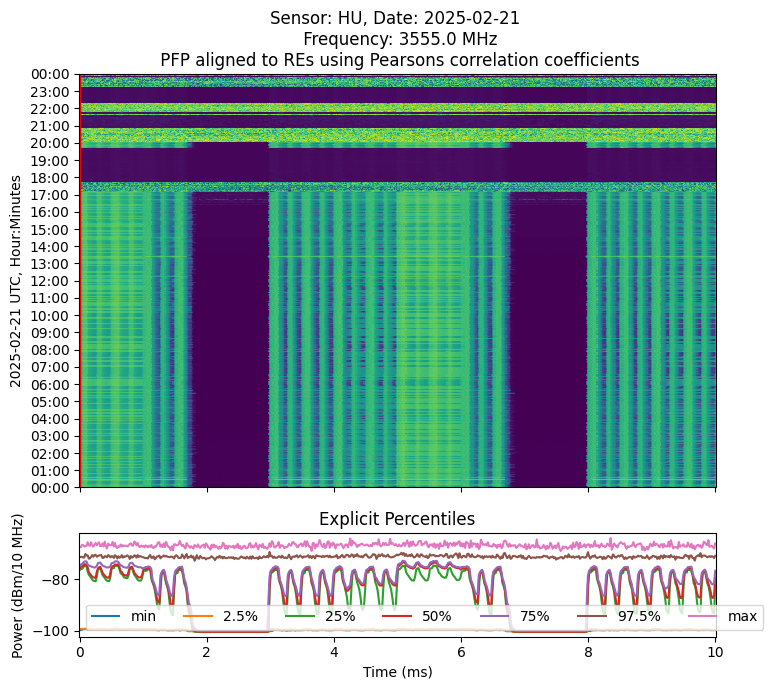

In [4]:
hu_20250221_plotter.plot_aligned_pfp(channel = 3555e6)

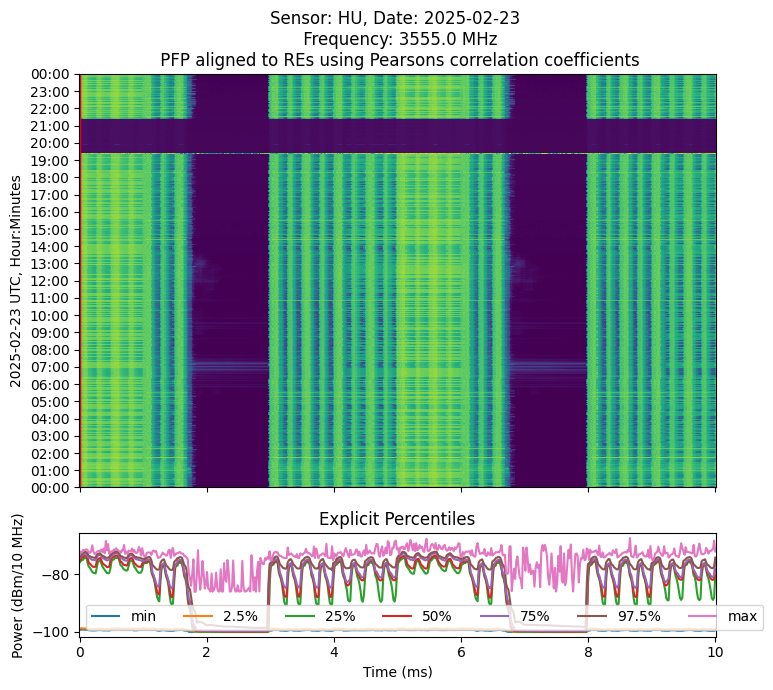

In [5]:
hu_20250223_plotter.plot_aligned_pfp(channel = 3555e6)

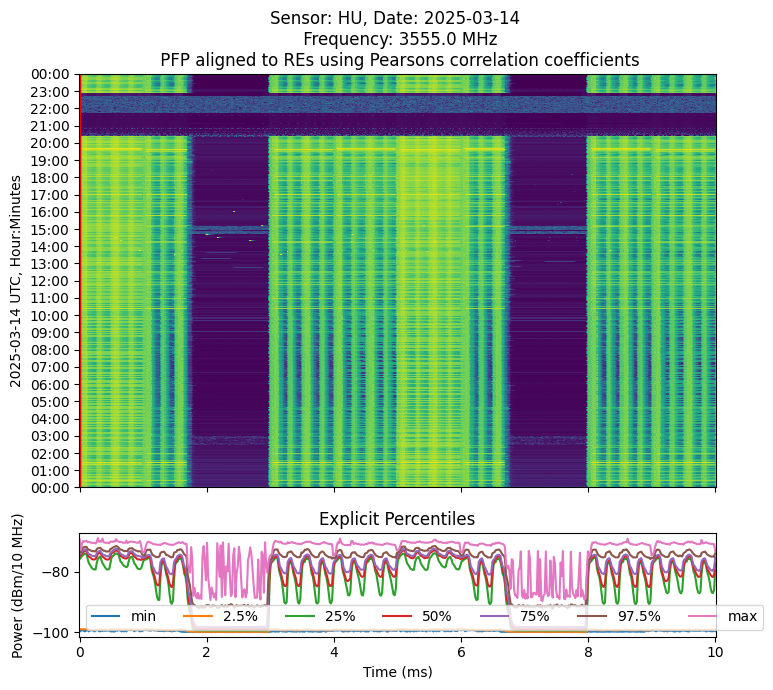

In [6]:
hu_20250314_plotter.plot_aligned_pfp(channel = 3555e6)

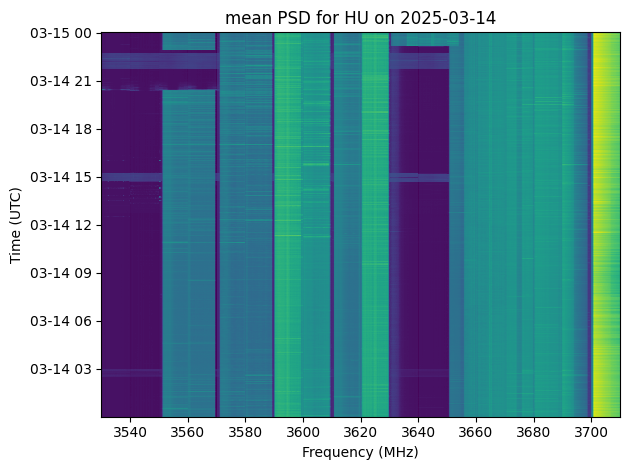

In [7]:
hu_20250314_plotter.plot_day_psd(capture_statistic="mean")

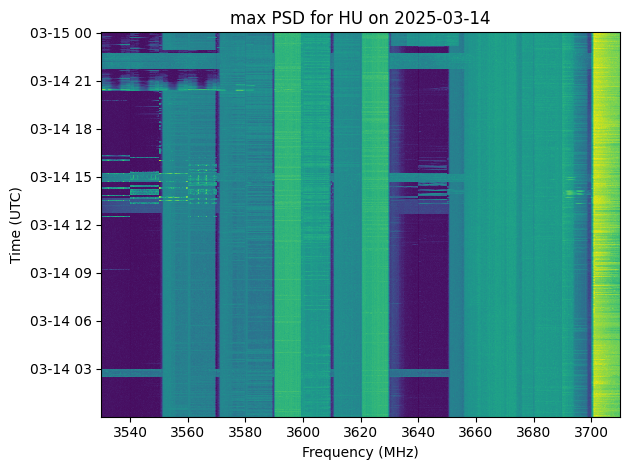

In [8]:
hu_20250314_plotter.plot_day_psd(capture_statistic="max")

Text(0, 0.5, 'Time (UTC)')

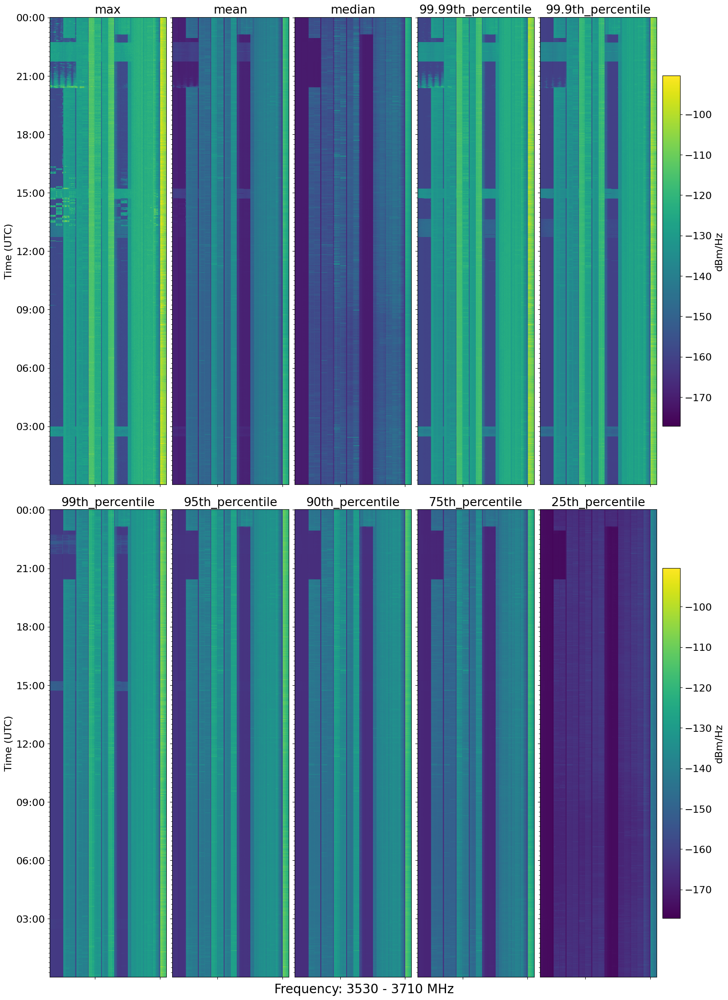

In [9]:
# we use this list to order the presentation of percentiles
percentiles = ['max', 'mean', 'median', '99.99th_percentile','99.9th_percentile',
               '99th_percentile','95th_percentile','90th_percentile','75th_percentile','25th_percentile']
psds = []
for percentile in percentiles:
    psd = hu_20250314.get_day_psd(capture_statistic=percentile)
    psds.append(psd)
# calculate global colorbar limits
vmin = np.min([psd.min() for psd in psds])
vmax = np.max([psd.max() for psd in psds])

# a time axis formatter for better presentation
date_formatter = mdates.DateFormatter("%H:%M")
minor_locator = mdates.MinuteLocator(interval = 15)
major_locator = mdates.HourLocator(interval=3)

plt.rcParams.update({'font.size': 16}) 
# Now we have 10 percentiles
figure,axes = plt.subplots(nrows = 2,ncols = 5, figsize = (16,22),sharey=True,sharex=True,layout='constrained')
axes = axes.flatten()
for ax_index,ax in enumerate(axes):
    psd  = psds[ax_index]
    if ax_index == 4:
        colormesh = ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    elif ax_index==9:
        colormesh_2 = ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    else:
        ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    ax.set_title(percentiles[ax_index])
    ax.yaxis.set_minor_locator(minor_locator)
    ax.yaxis.set_major_locator(major_locator)
    ax.yaxis.set_major_formatter(date_formatter)
    ax.tick_params(axis='x', labelbottom=False, labeltop=False)


figure.colorbar(colormesh,ax=axes[4],label="dBm/Hz", orientation='vertical')
figure.colorbar(colormesh_2,ax=axes[9],label="dBm/Hz", orientation='vertical')

figure.supxlabel("Frequency: 3530 - 3710 MHz",fontsize = 20)
# figure.suptitle("HU: 2025-08-14",fontsize = 20)
axes[0].set_ylabel("Time (UTC)")
axes[5].set_ylabel("Time (UTC)")



Text(0, 0.5, 'Time (UTC)')

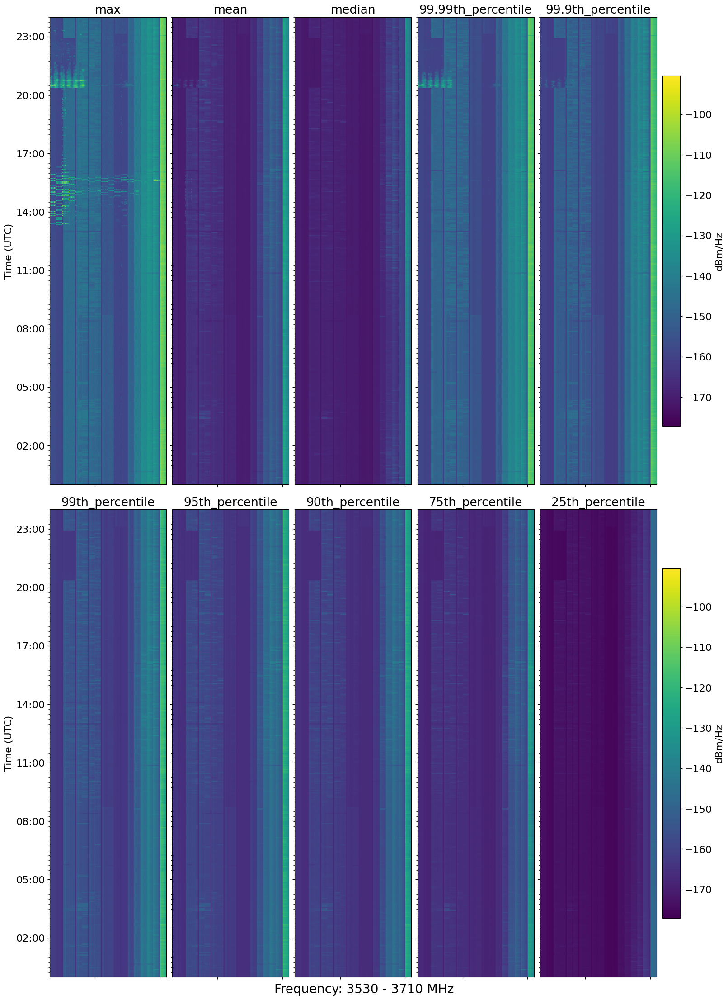

In [10]:

cbbt_psds = []
for percentile in percentiles:
    psd = cbbt_20250314.get_day_psd(capture_statistic=percentile)
    cbbt_psds.append(psd)
# calculate global colorbar limits
vmin = np.min([psd.min() for psd in psds])
vmax = np.max([psd.max() for psd in psds])

# a time axis formatter for better presentation
date_formatter = mdates.DateFormatter("%H:%M")
minor_locator = mdates.MinuteLocator(interval = 15)
major_locator = mdates.HourLocator(interval=3)

plt.rcParams.update({'font.size': 16}) 
# Now we have 10 percentiles
figure,axes = plt.subplots(nrows = 2,ncols = 5, figsize = (16,22),sharey=True,sharex=True,layout='constrained')
axes = axes.flatten()
for ax_index,ax in enumerate(axes):
    psd  = cbbt_psds[ax_index]
    if ax_index == 4:
        colormesh = ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    elif ax_index==9:
        colormesh_2 = ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    else:
        ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd,vmin=vmin,vmax=vmax)
    ax.set_title(percentiles[ax_index])
    ax.yaxis.set_minor_locator(minor_locator)
    ax.yaxis.set_major_locator(major_locator)
    ax.yaxis.set_major_formatter(date_formatter)
    ax.tick_params(axis='x', labelbottom=False, labeltop=False)


figure.colorbar(colormesh,ax=axes[4],label="dBm/Hz", orientation='vertical')
figure.colorbar(colormesh_2,ax=axes[9],label="dBm/Hz", orientation='vertical')

figure.supxlabel("Frequency: 3530 - 3710 MHz",fontsize = 20)
# figure.suptitle("HU: 2025-08-14",fontsize = 20)
axes[0].set_ylabel("Time (UTC)")
axes[5].set_ylabel("Time (UTC)")

In [11]:
sensor_1_data = [hu_20250221,hu_20250223,hu_20250314]
sensor_2_data = [cbbt_20250221,cbbt_20250223,cbbt_20250314]

In [41]:
psd_percentile = "max"
pfp_detector = "peak"
pfp_statistic = "max"
frequency = 3555e6
sensor_1_psds = list(map(lambda x:x.get_day_psd(capture_statistic=psd_percentile),sensor_1_data))
sensor_1_pfps = list(map(lambda x:x.get_aligned_pfp(channel=frequency,capture_statistic=pfp_statistic,detector=pfp_detector),sensor_1_data))

sensor_2_psds = list(map(lambda x:x.get_day_psd(capture_statistic=psd_percentile),sensor_2_data))
sensor_2_pfps = list(map(lambda x:x.get_aligned_pfp(channel=frequency,capture_statistic=pfp_statistic,detector=pfp_detector),sensor_2_data))

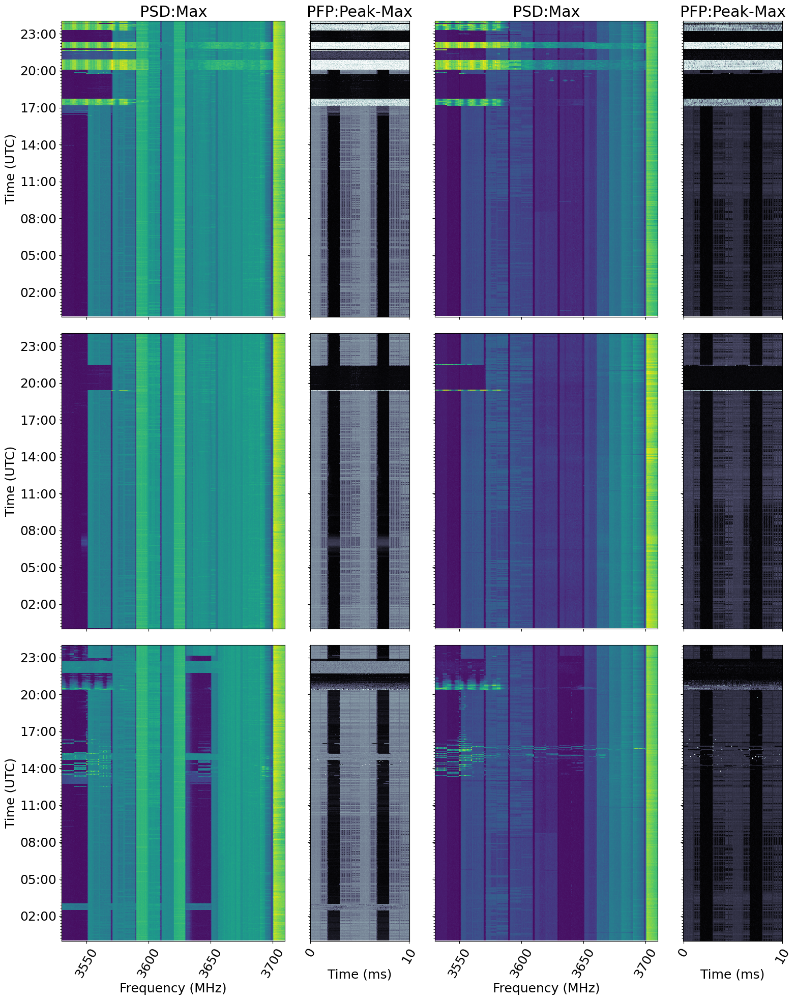

In [48]:
pfp_x_data = np.linspace(0,10,560)
date_formatter = mdates.DateFormatter("%H:%M")
minor_locator = mdates.MinuteLocator(interval = 15)
major_locator = mdates.HourLocator(interval=3)
plt.rcParams.update({"font.size":18})
figure = plt.figure(figsize = (16,20))
gs = matplotlib.gridspec.GridSpec(3,6)

# Grid Spec Setup
# Row 1
snr_1_psd_sensor_1 = figure.add_subplot(gs[0,0:2])
snr_1_pfp_sensor_1 = figure.add_subplot(gs[0,2],sharey=snr_1_psd_sensor_1)
snr_1_psd_sensor_2 = figure.add_subplot(gs[0,3:5],sharey=snr_1_psd_sensor_1)
snr_1_pfp_sensor_2 = figure.add_subplot(gs[0,5],sharey=snr_1_psd_sensor_1)
#################################################
# Row 2
snr_2_psd_sensor_1 = figure.add_subplot(gs[1,0:2])
snr_2_pfp_sensor_1 = figure.add_subplot(gs[1,2],sharey=snr_2_psd_sensor_1)
snr_2_psd_sensor_2 = figure.add_subplot(gs[1,3:5],sharey=snr_2_psd_sensor_1)
snr_2_pfp_sensor_2 = figure.add_subplot(gs[1,5],sharey=snr_2_psd_sensor_1)
##################################################
# Row 3
snr_3_psd_sensor_1 = figure.add_subplot(gs[2,0:2])
snr_3_pfp_sensor_1 = figure.add_subplot(gs[2,2],sharey=snr_3_psd_sensor_1)
snr_3_psd_sensor_2 = figure.add_subplot(gs[2,3:5],sharey=snr_3_psd_sensor_1)
snr_3_pfp_sensor_2 = figure.add_subplot(gs[2,5],sharey=snr_3_psd_sensor_1)
#################################################
sensor_1_psd_axes = [snr_1_psd_sensor_1,snr_2_psd_sensor_1,snr_3_psd_sensor_1]
for ax_index,ax in enumerate(sensor_1_psd_axes):
    psd = sensor_1_psds[ax_index]
    ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd)
    if ax_index ==0:
        ax.set_title(f"PSD:{psd_percentile.capitalize()}")
    if ax_index ==2:
        ax.tick_params("x",labelbottom=True,rotation=60)
        ax.set_xlabel("Frequency (MHz)")

    else:
        ax.tick_params(labelbottom=False)
sensor_1_pfp_axes = [snr_1_pfp_sensor_1,snr_2_pfp_sensor_1,snr_3_pfp_sensor_1]
for ax_index,ax in enumerate(sensor_1_pfp_axes):
    pfp_ = sensor_1_pfps[ax_index]    
    colormesh = ax.pcolormesh(pfp_x_data,pfp_.index,pfp_,cmap="bone")
    ax.tick_params(labelbottom=False, labelleft=False)
    if ax_index ==0:
        ax.set_title(f"PFP:{pfp_detector.capitalize()}-{pfp_statistic.capitalize()}")
    if ax_index ==2:
       ax.tick_params(labelbottom=True,rotation=60)
       ax.set_xlabel("Time (ms)")

    else:
        ax.tick_params(labelbottom=False)
sensor_2_psd_axes = [snr_1_psd_sensor_2,snr_2_psd_sensor_2,snr_3_psd_sensor_2]
for ax_index,ax in enumerate(sensor_2_psd_axes):
    psd = sensor_2_psds[ax_index]
    ax.pcolormesh(1e-6*psd.columns.astype(float),psd.index,psd)
    ax.tick_params(labelbottom=False, labelleft=False)
    if ax_index ==0:
        ax.set_title(f"PSD:{psd_percentile.capitalize()}")
    if ax_index ==2:
        ax.tick_params(labelbottom=True,rotation=60)
        ax.set_xlabel("Frequency (MHz)")
    else:
        ax.tick_params(labelbottom=False)
sensor_2_pfp_axes = [snr_1_pfp_sensor_2,snr_2_pfp_sensor_2,snr_3_pfp_sensor_2]
for ax_index,ax in enumerate(sensor_2_pfp_axes):
    pfp_ = sensor_2_pfps[ax_index]    
    colormesh = ax.pcolormesh(pfp_x_data,pfp_.index,pfp_,cmap="bone")
    ax.tick_params(labelbottom=False, labelleft=False)
    if ax_index ==0:
        ax.set_title(f"PFP:{pfp_detector.capitalize()}-{pfp_statistic.capitalize()}")
    if ax_index ==2:
        ax.tick_params(labelbottom=True,rotation=60)
        ax.set_xlabel("Time (ms)")
    else:
        ax.tick_params(labelbottom=False)
# for ax_index,ax in enumerate(sensor_1_psd_axes):
#     ax.tick_params(labelbottom=False, labelleft=True)
snr_1_psd_sensor_1.set_ylabel("Time (UTC)")
# figure.colorbar(colormesh,ax=ax1,label="dBm/10 MHz")
snr_1_psd_sensor_1.yaxis.set_minor_locator(mdates.MinuteLocator(interval = 15))
snr_1_psd_sensor_1.yaxis.set_major_locator(  mdates.HourLocator(interval=3))
snr_1_psd_sensor_1.yaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
snr_1_psd_sensor_1.set_ylabel("Time (UTC)")
# figure.colorbar(colormesh,ax=ax1,label="dBm/10 MHz")
snr_2_psd_sensor_1.yaxis.set_minor_locator(mdates.MinuteLocator(interval = 15))
snr_2_psd_sensor_1.yaxis.set_major_locator(  mdates.HourLocator(interval=3))
snr_2_psd_sensor_1.yaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
snr_2_psd_sensor_1.set_ylabel("Time (UTC)")
# # ax1.set_xlabel("Periodic Frame Time (ms) ")
# # figure.colorbar(colormesh,ax=ax1,label="dBm/10 MHz")
snr_3_psd_sensor_1.yaxis.set_minor_locator(mdates.MinuteLocator(interval = 15))
snr_3_psd_sensor_1.yaxis.set_major_locator(  mdates.HourLocator(interval=3))
snr_3_psd_sensor_1.yaxis.set_major_formatter(mdates.DateFormatter("%H:%M"))
snr_3_psd_sensor_1.set_ylabel("Time (UTC)")
# border_ax = figure.add_subplot(gs[:, 0:2], frameon=True)
# border_ax.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
#                       bottom=False, top=False, left=False, right=False)
# border_ax.set_facecolor('none')  # Make interior transparent
# for spine in border_ax.spines.values():
#     spine.set_edgecolor('k')
#     spine.set_linewidth(4)
#     spine.set_linestyle('--')

# border_ax2 = figure.add_subplot(gs[:, 2:], frameon=True)
# border_ax2.tick_params(labelbottom=False, labeltop=False, labelleft=False, labelright=False,
#                       bottom=False, top=False, left=False, right=False)
# border_ax2.set_facecolor('none')  # Make interior transparent
# for spine in border_ax2.spines.values():
#     spine.set_edgecolor('k')
#     spine.set_linewidth(4)
#     spine.set_linestyle('--')
plt.tight_layout()